# ESM-GCN
---
## Predicted vs Measured
### Extracting the values

In [6]:
import os
import sys
import pandas as pd
import torch
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader as TorchDataLoader
from torch_geometric.loader import DataLoader as GeometricDataLoader

import lightning as L

from transformers import EsmTokenizer, EsmModel

from torch_geometric.data import Data, Batch
from torch_geometric.nn import SAGEConv, global_mean_pool

class DmsDataset(Dataset):
    def __init__(self, csv_file:str, binding_or_expression:str):
        """
        Load from csv file into pandas:
        - sequence label ('labels'), 
        - 'sequence',
        - binding or expression target ('binding_or_expression')
        """
        try:
            self.full_df = pd.read_csv(csv_file, sep=',', header=0)
            self.target = 'ACE2-binding_affinity' if 'binding' in binding_or_expression else 'RBD_expression'
        except (FileNotFoundError, pd.errors.ParserError, Exception) as e:
            print(f"Error reading in .csv file: {csv_file}\n{e}", file=sys.stderr)
            sys.exit(1)

    def __len__(self) -> int:
        return len(self.full_df)

    def __getitem__(self, idx):
        # label, seq, target
        return self.full_df['label'][idx], self.full_df['sequence'][idx], self.full_df[self.target][idx]

class DmsDataModule(L.LightningDataModule):
    def __init__(self, data_dir: str, binding_or_expression:str, torch_geometric_tag: bool, batch_size: int, num_workers: int, seed: int):
        super().__init__()
        self.data_dir = data_dir
        self.binding_or_expression = binding_or_expression
        self.torch_geometric_tag = torch_geometric_tag
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.seed = seed

        # Set seeds globally for reproducibility
        L.seed_everything(self.seed, workers=True)

    def setup(self, stage):
        # Called on every GPU
        if stage == 'fit':
            self.train_dataset = DmsDataset(os.path.join(self.data_dir, "mutation_combined_DMS_OLD_train.csv"), self.binding_or_expression)
            self.val_dataset = DmsDataset(os.path.join(self.data_dir, "mutation_combined_DMS_OLD_test.csv"), self.binding_or_expression)

    def train_dataloader(self):
        loader = GeometricDataLoader if self.torch_geometric_tag else TorchDataLoader

        return loader(
            self.train_dataset, 
            batch_size=self.batch_size, 
            shuffle=True, 
            num_workers=self.num_workers,
            generator=torch.Generator().manual_seed(self.seed),
            pin_memory=True
        )
        
    def val_dataloader(self):
        loader = GeometricDataLoader if self.torch_geometric_tag else TorchDataLoader

        return loader(
            self.val_dataset, 
            batch_size=self.batch_size, 
            shuffle=False, 
            num_workers=self.num_workers,
            generator=torch.Generator().manual_seed(self.seed),
            pin_memory=True
        )

class GraphSAGE(L.LightningModule):
    def __init__(self, input_channels, hidden_channels, fcn_num_layers):
        super().__init__()
        self.conv1 = SAGEConv(input_channels, hidden_channels)
        self.conv2 = SAGEConv(hidden_channels, hidden_channels)

        # FCN layer(s)
        layers = []

        for _ in range(fcn_num_layers):
            layers.append(nn.Linear(hidden_channels, hidden_channels))
            layers.append(nn.ReLU())

        self.fcn = nn.Sequential(*layers)
        
        self.out = nn.Linear(hidden_channels, 1)

    def forward(self, x, edge_index, batch):
        x = self.conv1(x, edge_index)
        x = self.conv2(x, edge_index)
        x = global_mean_pool(x, batch)
        x = self.fcn(x)
        prediction = self.out(x).squeeze(1)
        return prediction

class LightningEsmGcn(L.LightningModule):
    def __init__(self, 
                 script_letter:str, binding_or_expression:str,
                 lr: float, max_len: int, gcn_model: GraphSAGE, esm_version="facebook/esm2_t6_8M_UR50D", from_saved=None):
        super().__init__()
        self.script_letter = script_letter
        self.binding_or_expression = binding_or_expression
        self.tokenizer = EsmTokenizer.from_pretrained(esm_version, cache_dir="../../../.cache")
        self.esm = EsmModel.from_pretrained(esm_version, cache_dir="../../../.cache")
        self.gcn = gcn_model
        self.lr = lr
        self.max_len = max_len
        self.batch_dataframes = []

        # Load fine-tuned weights 
        if from_saved is not None:
            if trainer.global_rank == 0: print(f"Loading model checkpoint from {from_saved}...")

            ckpt = torch.load(from_saved, map_location="cpu")
            state_dict = ckpt["state_dict"]
            self.load_state_dict(state_dict, strict=True)

    def forward(self, input_ids, attention_mask, targets):
        esm_last_hidden_state = self.esm(input_ids=input_ids, attention_mask=attention_mask).last_hidden_state # shape: [batch_size, sequence_length, embedding_dim]
        esm_aa_embedding = esm_last_hidden_state[:, 1:-1, :] # Amino Acid-level representations, [batch_size, sequence_length-2, embedding_dim], excludes 1st and last tokens
        
        # Graph Construction
        graphs = []
        for embedding, target in zip(esm_aa_embedding, targets):
            edges = [(i, i+1) for i in range(embedding.size(0) - 1)]
            edge_index = torch.tensor(edges, dtype=torch.int64).t().contiguous()

            graphs.append(Data(
                x=embedding, 
                edge_index=edge_index,
                y=torch.tensor([target], dtype=torch.float32)
            ))

        batch_graph = Batch.from_data_list(graphs).to(self.device)
        output = self.gcn(batch_graph.x, batch_graph.edge_index, batch_graph.batch)

        return output, batch_graph.y
    
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr)

    def training_step(self, batch, batch_idx):
        seq_ids, seqs, targets = batch
        targets = targets.to(self.device).float()
        batch_size = targets.size(0)

        tokenized = self.tokenizer(seqs, return_tensors="pt", padding=True, truncation=True, max_length=self.max_len)
        tokenized = {k: v.to(self.device) for k, v in tokenized.items()}

        preds, y = self(input_ids=tokenized["input_ids"], attention_mask=tokenized["attention_mask"], targets=targets)

        # Create a DataFrame for the batch
        batch_df = pd.DataFrame({
            "seq_id": seq_ids,
            "measured_value": [target.item() for target in y],
            "predicted_value": [pred.item() for pred in preds],
            "mode": ["train"] * batch_size
        })

        self.batch_dataframes.append(batch_df)

    def validation_step(self, batch, batch_idx):
        seq_ids, seqs, targets = batch
        targets = targets.to(self.device).float()
        batch_size = targets.size(0)

        tokenized = self.tokenizer(seqs, return_tensors="pt", padding=True, truncation=True, max_length=self.max_len)
        tokenized = {k: v.to(self.device) for k, v in tokenized.items()}

        preds, y = self(input_ids=tokenized["input_ids"], attention_mask=tokenized["attention_mask"], targets=targets)

        # Create a DataFrame for the batch
        batch_df = pd.DataFrame({
            "seq_id": seq_ids,
            "measured_value": [target.item() for target in y],
            "predicted_value": [pred.item() for pred in preds],
            "mode": ["test"] * batch_size
        })

        self.batch_dataframes.append(batch_df)

    def on_fit_end(self):
        # Concatenate all batch DataFrames into one and save
        result_df = pd.concat(self.batch_dataframes, ignore_index=True)
        result_df.to_csv(f"scatter/esm_gcn/esm_gcn.{self.script_letter}.{self.binding_or_expression}-predicted_vs_measured.values.csv", index=False)
        print("Saved prediction vs measured values.")

A

In [7]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "A"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774823/ckpt/best_model-epoch=306.val_rmse=1.1718.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774823/ckpt/best_model-epoch=306.val_rmse=1.1718.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:56<00:00,  7.30it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:56<00:00,  7.30it/s]
Saved prediction vs measured values.


In [8]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "A"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774824/ckpt/best_model-epoch=499.val_rmse=0.6067.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774824/ckpt/best_model-epoch=499.val_rmse=0.6067.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:42<00:00,  7.92it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:42<00:00,  7.92it/s]
Saved prediction vs measured values.


B

In [9]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "B"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774825/ckpt/best_model-epoch=973.val_rmse=1.1707.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774825/ckpt/best_model-epoch=973.val_rmse=1.1707.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:23<00:00,  8.98it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:23<00:00,  8.98it/s]
Saved prediction vs measured values.


In [10]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "B"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774826/ckpt/best_model-epoch=998.val_rmse=0.6365.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774826/ckpt/best_model-epoch=998.val_rmse=0.6365.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:43<00:00,  7.86it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:43<00:00,  7.86it/s]
Saved prediction vs measured values.


C

In [11]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "C"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774828/ckpt/best_model-epoch=419.val_rmse=0.5397.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774828/ckpt/best_model-epoch=419.val_rmse=0.5397.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:35<00:00,  8.24it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:35<00:00,  8.24it/s]
Saved prediction vs measured values.


In [12]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "C"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774827/ckpt/best_model-epoch=798.val_rmse=0.3265.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774827/ckpt/best_model-epoch=798.val_rmse=0.3265.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:31<00:00,  8.49it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:31<00:00,  8.49it/s]
Saved prediction vs measured values.


D

In [13]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "D"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774829/ckpt/best_model-epoch=998.val_rmse=0.5913.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774829/ckpt/best_model-epoch=998.val_rmse=0.5913.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:47<00:00,  7.69it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:47<00:00,  7.69it/s]
Saved prediction vs measured values.


In [14]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "D"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774830/ckpt/best_model-epoch=182.val_rmse=0.3519.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21774830/ckpt/best_model-epoch=182.val_rmse=0.3519.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:21<00:00,  9.10it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:21<00:00,  9.10it/s]
Saved prediction vs measured values.


E

In [15]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "E"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837274/ckpt/best_model-epoch=590.val_rmse=1.1662.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837274/ckpt/best_model-epoch=590.val_rmse=1.1662.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:45<00:00,  7.77it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:45<00:00,  7.77it/s]
Saved prediction vs measured values.


In [16]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "E"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837275/ckpt/best_model-epoch=814.val_rmse=0.6624.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837275/ckpt/best_model-epoch=814.val_rmse=0.6624.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:35<00:00,  8.26it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:35<00:00,  8.26it/s]
Saved prediction vs measured values.


F

In [17]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "F"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837276/ckpt/best_model-epoch=987.val_rmse=1.2181.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837276/ckpt/best_model-epoch=987.val_rmse=1.2181.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:33<00:00,  8.38it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:33<00:00,  8.38it/s]
Saved prediction vs measured values.


In [18]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "F"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837277/ckpt/best_model-epoch=998.val_rmse=0.7113.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837277/ckpt/best_model-epoch=998.val_rmse=0.7113.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:38<00:00,  8.11it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:38<00:00,  8.11it/s]
Saved prediction vs measured values.


G

In [19]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "G"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837278/ckpt/best_model-epoch=391.val_rmse=0.5513.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837278/ckpt/best_model-epoch=391.val_rmse=0.5513.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:19<00:00,  9.18it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:20<00:00,  9.18it/s]
Saved prediction vs measured values.


In [20]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "G"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-4,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837279/ckpt/best_model-epoch=833.val_rmse=0.3391.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837279/ckpt/best_model-epoch=833.val_rmse=0.3391.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:36<00:00,  8.22it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:36<00:00,  8.22it/s]
Saved prediction vs measured values.


H

In [21]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "H"
binding_or_expression = "binding"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837281/ckpt/best_model-epoch=979.val_rmse=0.6041.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837281/ckpt/best_model-epoch=979.val_rmse=0.6041.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:20<00:00,  9.12it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:20<00:00,  9.12it/s]
Saved prediction vs measured values.


In [22]:
# Random seed
seed = 0
L.seed_everything(seed)  # Set seed for reproducibility
data_dir = "../../data/dms"

# Trainer setup 
trainer= L.Trainer(
    max_epochs=1,
    limit_train_batches=1.0,    # 1.0 is 100% of batches
    limit_val_batches=1.0,      # 1.0 is 100% of batches
    num_sanity_val_steps=0,     # Disables sanity check
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    num_nodes=1,
    devices=1,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=True
)

# GraphSAGE input, size should match used ESM model embedding_dim size
size = 320
input_channels = size   
hidden_channels = size
fcn_num_layers = 5
gcn = GraphSAGE(input_channels, hidden_channels, fcn_num_layers)

# Initialize DataModule and model
script_letter = "H"
binding_or_expression = "expression"

dm = DmsDataModule(
    data_dir=data_dir,
    binding_or_expression=binding_or_expression,  
    torch_geometric_tag=True, 
    batch_size=64,
    num_workers=4, 
    seed=seed
)

model = LightningEsmGcn(
    script_letter=script_letter,
    binding_or_expression=binding_or_expression, 
    lr=1e-5,
    max_len=280,
    gcn_model=gcn,
    esm_version="facebook/esm2_t6_8M_UR50D",
    from_saved="/data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837282/ckpt/best_model-epoch=109.val_rmse=0.3669.ckpt"
)

trainer.fit(model, dm)

Seed set to 0
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..
Seed set to 0
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Loading model checkpoint from /data/spike_ml/Spike_NLP-Lightning/src/pnlp/ESM_TL/logs/esm_gcn/version_21837282/ckpt/best_model-epoch=109.val_rmse=0.3669.ckpt...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type      | Params | Mode 
-------------------------------------------
0 | esm  | EsmModel  | 7.8 M  | eval 
1 | gcn  | GraphSAGE | 924 K  | train
-------------------------------------------
8.8 M     Trainable params
0         Non-trainable params
8.8 M     Total params
35.057    Total estimated model params size (MB)
21        Modules in train mode
122       Modules in eval mode


Epoch 0: 100%|██████████| 1285/1285 [02:29<00:00,  8.62it/s]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 1285/1285 [02:29<00:00,  8.62it/s]
Saved prediction vs measured values.


### Extracting Wildtype Binding and Expression 
To have our comparison to the wildtype values, we need to extract the predictions. We'll find the average value for each binding and expression and plot them on the scatter plot. From this, we can get the R^2 values.

In [23]:
import os
import pandas as pd

data_dir = "../../data/dms/original"
binding_df = pd.read_csv(os.path.join(data_dir, "binding_Kds.csv"), sep=',', header=0)
binding_df = binding_df.dropna(subset=['log10Ka']).reset_index(drop=True)
wildtype_b_df = binding_df[binding_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_b_df = wildtype_b_df[['target', 'variant_class', 'aa_substitutions', 'log10Ka']].copy()
wildtype_b_df['mean_log10Ka'] = wildtype_b_df.groupby('target')['log10Ka'].transform('mean')
binding_wt = wildtype_b_df['mean_log10Ka'][8] 

expression_df = pd.read_csv(os.path.join(data_dir, "expression_meanFs.csv"), sep=',', header=0)
expression_df = expression_df.dropna(subset=['ML_meanF']).reset_index(drop=True)
wildtype_e_df = expression_df[expression_df['variant_class'].str.contains('wildtype', case=False, na=False)]
wildtype_e_df = wildtype_e_df[['target', 'variant_class', 'aa_substitutions', 'ML_meanF']].copy()
wildtype_e_df['mean_ML_meanF'] = wildtype_e_df.groupby('target')['ML_meanF'].transform('mean')
expression_wt = wildtype_e_df['mean_ML_meanF'][11]

print(f"WT binding: {binding_wt}, WT expression: {expression_wt}")

WT binding: 10.792732335537766, WT expression: 10.29234282907662


### Plotting Predicted vs Measured Scatterplot

In [24]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

def plot_predicted_value_scatter_with_threshold(merged_df, binding_or_expression, title, save_path, wt_loc, threshold_percent=10):
    sns.set_style('whitegrid')
    sns.set_context('poster')
    plt.figure(figsize=(16, 10))
    ax = plt.gca()

    # Calculate R² for test data
    test_all_df = merged_df[merged_df['mode'] == 'test']
    r2_value = r2_score(test_all_df["measured_value"], test_all_df["predicted_value"])
    print(f"R^2: {r2_value}")

    # Calculate the threshold as 10% of measured values
    merged_df['threshold'] = merged_df["measured_value"] * (threshold_percent/100)
    merged_df['abs_diff'] = np.abs(merged_df["measured_value"] - merged_df["predicted_value"])
    
    # Separate data based on the relative threshold
    within_threshold = merged_df[merged_df['abs_diff'] <= merged_df['threshold']]
    outside_threshold = merged_df[merged_df['abs_diff'] > merged_df['threshold']]

    test_outside_df = outside_threshold[outside_threshold['mode'] == 'test']
    r2_outside_value = r2_score(test_outside_df["measured_value"], test_outside_df["predicted_value"])
    print(f"R^2 outside of threshold: {r2_outside_value}")

    test_inside_df = within_threshold[within_threshold['mode'] == 'test']
    r2_inside_value = r2_score(test_inside_df["measured_value"], test_inside_df["predicted_value"])
    print(f"R^2 inside of threshold: {r2_inside_value}")

    # Plot train and test data within threshold
    marker_size = 35

    test_df = within_threshold[within_threshold['mode'] == 'test']
    sns.scatterplot(
        x=test_df["measured_value"],
        y=test_df["predicted_value"],
        s=marker_size,
        color="tab:orange",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Test =<10%"
    )

    train_df = within_threshold[within_threshold['mode'] == 'train']
    sns.scatterplot(
        x=train_df["measured_value"],
        y=train_df["predicted_value"],
        s=marker_size,
        color="tab:blue",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label="Train =<10%"
    )

    # Plot train and test data outside threshold (greyed out)
    sns.scatterplot(
        data=outside_threshold,
        x="measured_value",
        y="predicted_value",
        s=marker_size,
        color="gray",
        edgecolor="black",
        alpha=0.5,
        ax=ax,
        label=">10%"
    )

    # Add vertical line wildtype loc
    plt.axvline(x=wt_loc, color='black', linestyle='-', linewidth=2)
    plt.text(
        wt_loc, 4.5, 'wt', 
        verticalalignment='bottom',
        horizontalalignment='center',
        )

    plt.xlim(5.25, 11.5)
    plt.ylim(5.25, 11.5)
    plt.xlabel(f"Measured {binding_or_expression}")
    plt.ylabel(f"Predicted {binding_or_expression}")
    plt.title(f"{title}\nR² = {r2_value:.4f}")
    plt.legend(loc="upper left", markerscale=3)
    plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
    plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')
    plt.tight_layout()
    plt.show()

    return r2_value

R^2: 0.6223320840124591
R^2 outside of threshold: -0.1395859521587013
R^2 inside of threshold: 0.9580890807107825


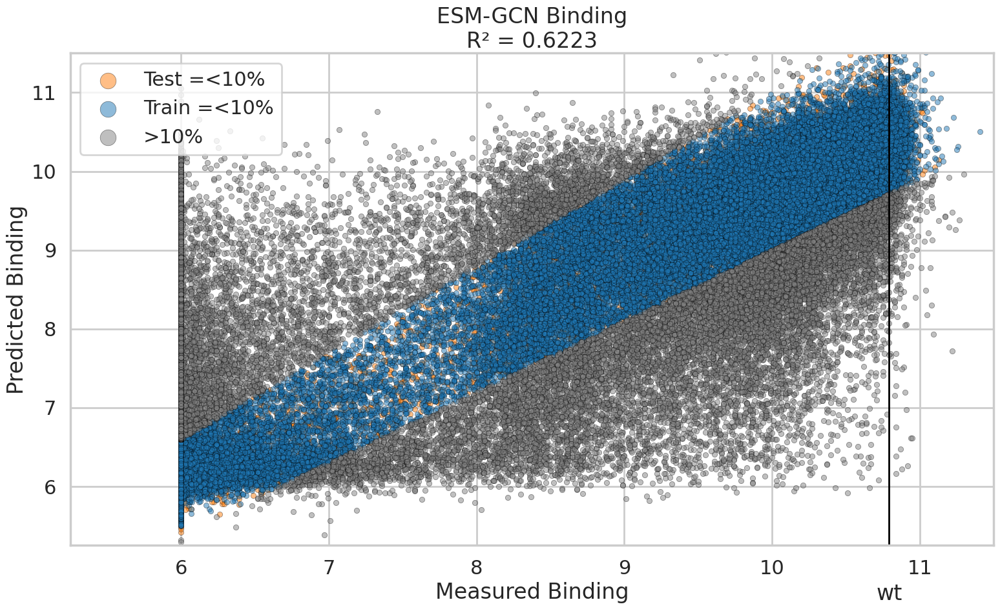

R^2: 0.6231528276600872
R^2 outside of threshold: -0.060224163979748946
R^2 inside of threshold: 0.9570900296087768


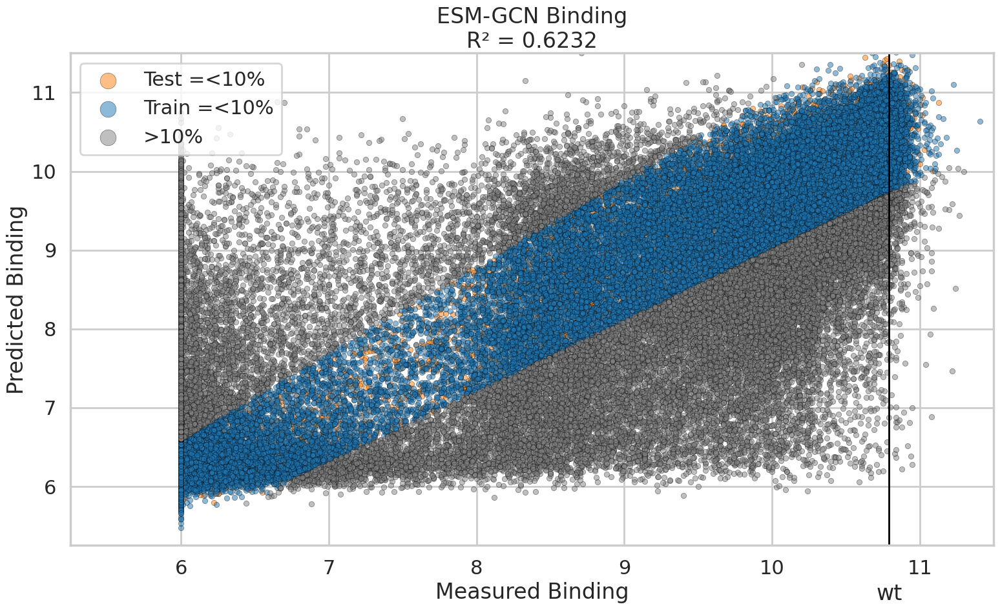

R^2: 0.9199186564939315
R^2 outside of threshold: -0.628930468375537
R^2 inside of threshold: 0.9868724638355548


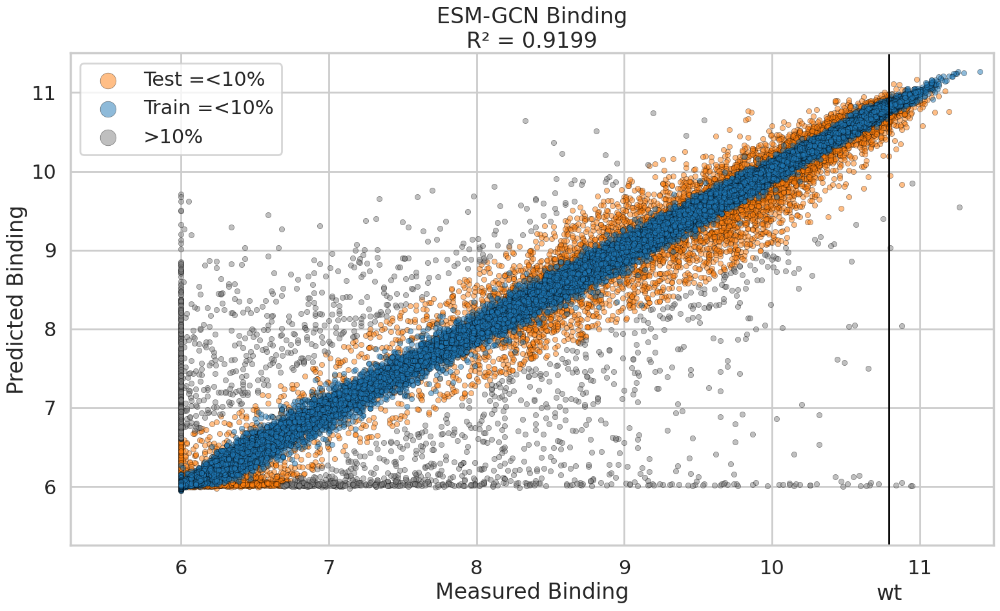

R^2: 0.9038806813486306
R^2 outside of threshold: -0.38757113864852366
R^2 inside of threshold: 0.9837381505957408


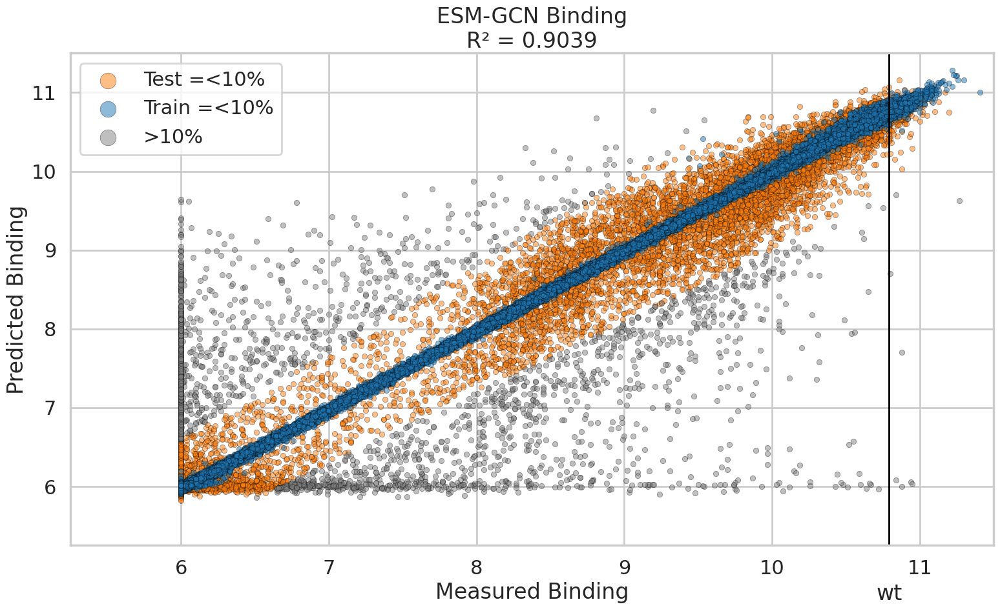

R^2: 0.625986065495006
R^2 outside of threshold: -0.13391398076247674
R^2 inside of threshold: 0.9598326803234076


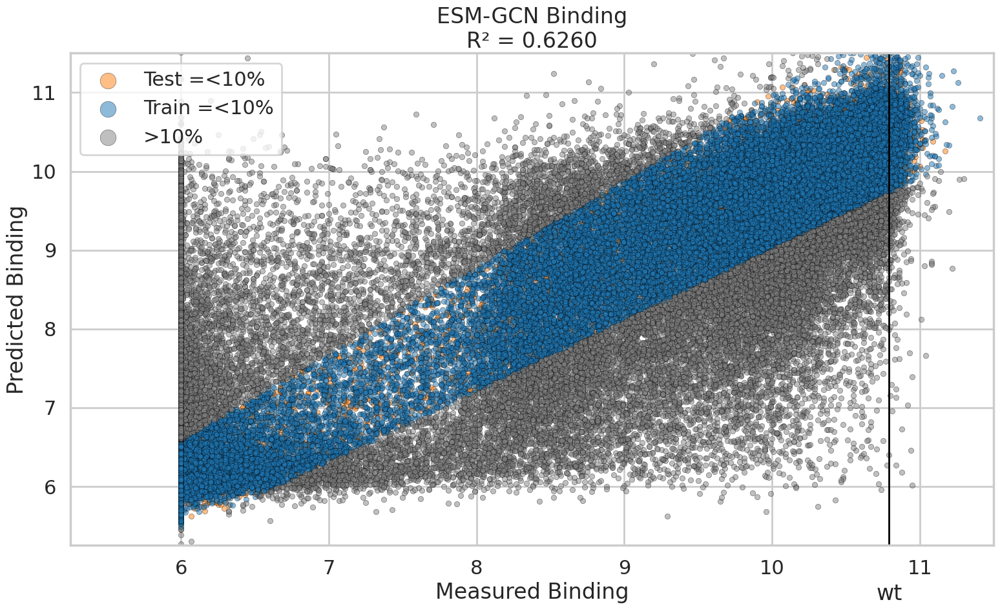

R^2: 0.5919726399364468
R^2 outside of threshold: 0.11405440206186956
R^2 inside of threshold: 0.9466525533664556


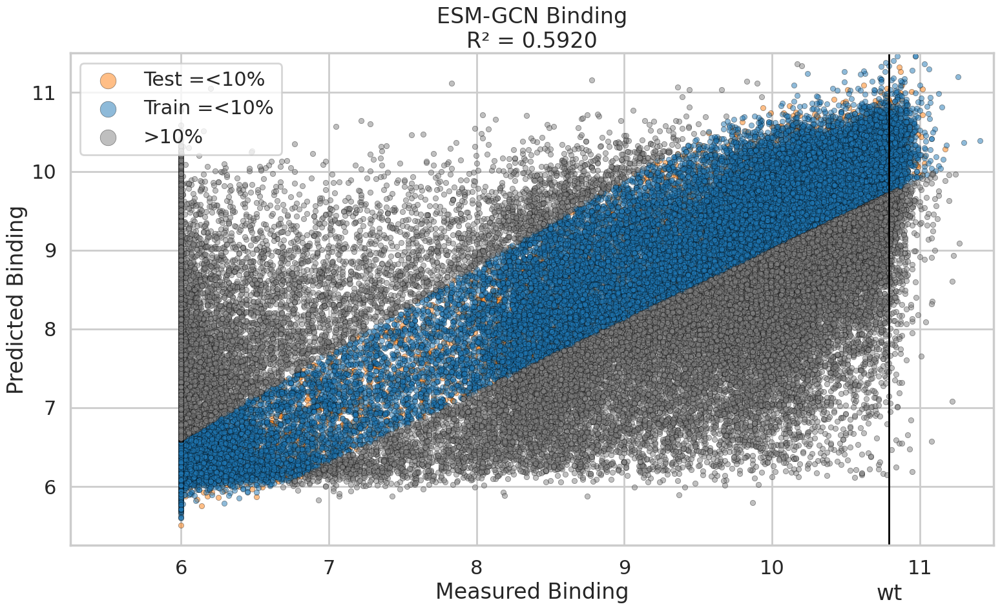

R^2: 0.9164182530019397
R^2 outside of threshold: -0.5692392209955104
R^2 inside of threshold: 0.987006670231721


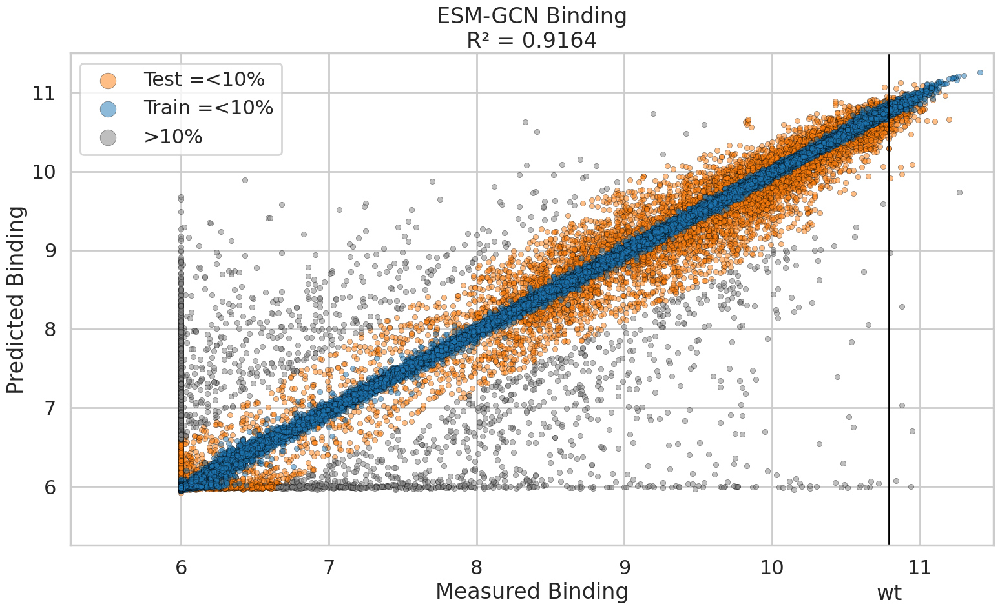

R^2: 0.8996575171700016
R^2 outside of threshold: -0.3244412886331045
R^2 inside of threshold: 0.9832515350905117


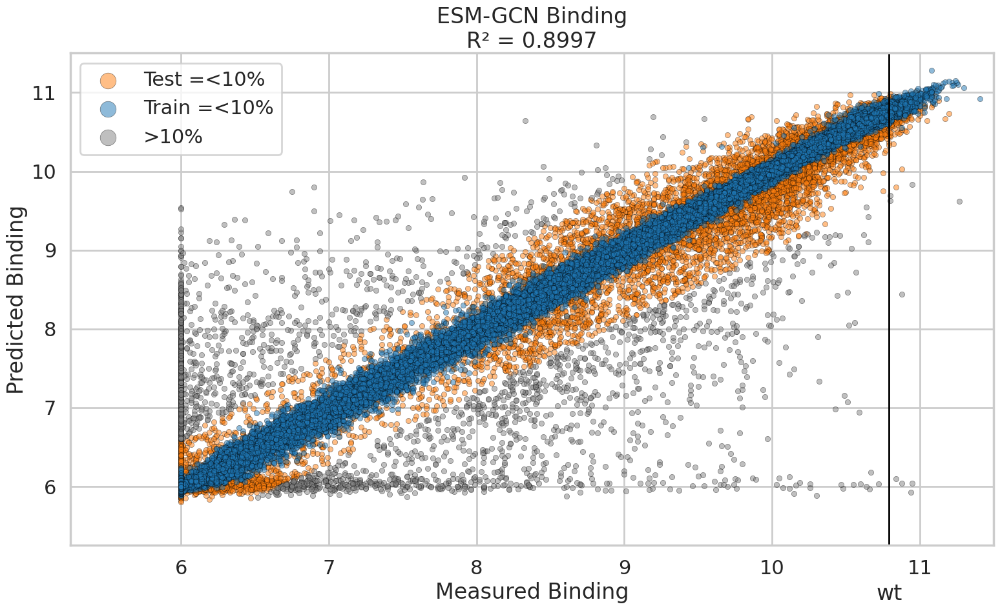

In [25]:
# Binding
df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.A.binding-predicted_vs_measured.values.csv")
esm_gcn_a_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.A.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.B.binding-predicted_vs_measured.values.csv")
esm_gcn_b_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.B.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.C.binding-predicted_vs_measured.values.csv")
esm_gcn_c_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.C.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.D.binding-predicted_vs_measured.values.csv")
esm_gcn_d_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.D.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.E.binding-predicted_vs_measured.values.csv")
esm_gcn_e_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.E.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.F.binding-predicted_vs_measured.values.csv")
esm_gcn_f_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.F.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.G.binding-predicted_vs_measured.values.csv")
esm_gcn_g_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.G.binding-predicted_vs_measured.scatter", binding_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.H.binding-predicted_vs_measured.values.csv")
esm_gcn_h_binding = plot_predicted_value_scatter_with_threshold(df, "Binding", "ESM-GCN Binding", "scatter/esm_gcn/esm_gcn.H.binding-predicted_vs_measured.scatter", binding_wt)

R^2: 0.6299081382919702
R^2 outside of threshold: -0.2477902872939317
R^2 inside of threshold: 0.8374683050155337


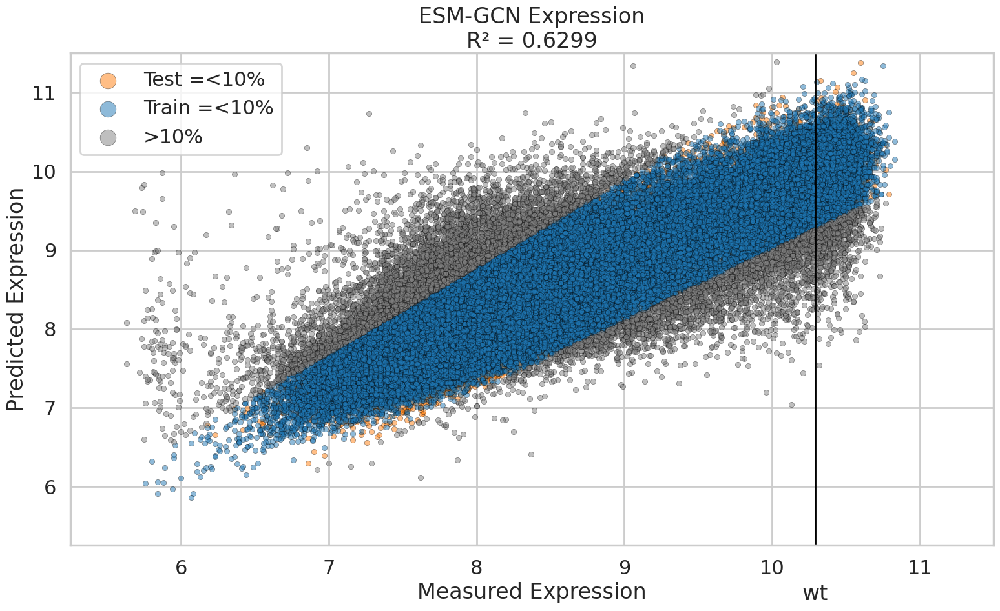

R^2: 0.5926177410430962
R^2 outside of threshold: -0.09894450364906837
R^2 inside of threshold: 0.820840241825087


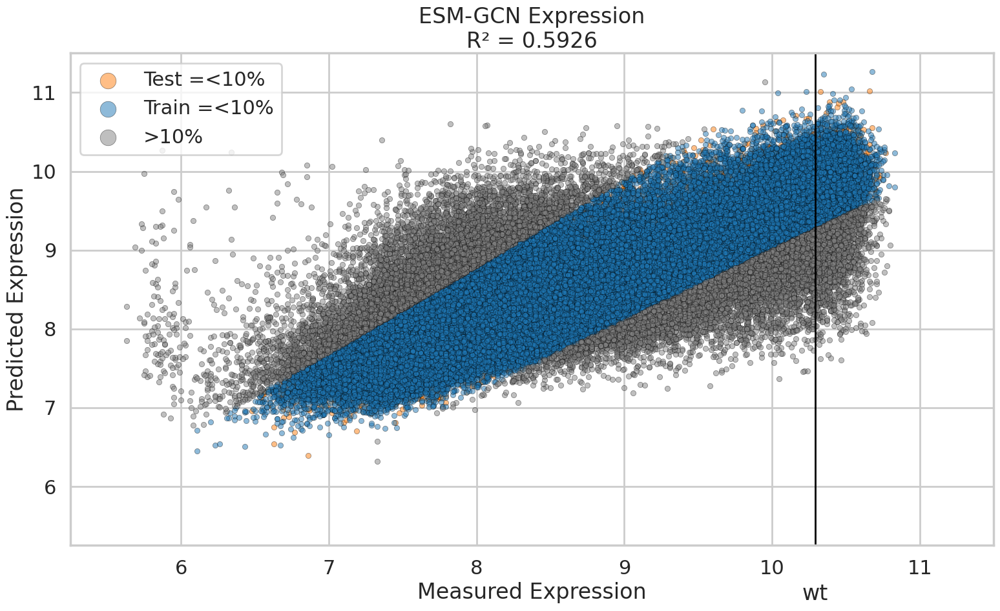

R^2: 0.8927694832955763
R^2 outside of threshold: -0.13634666462570677
R^2 inside of threshold: 0.9231051668859698


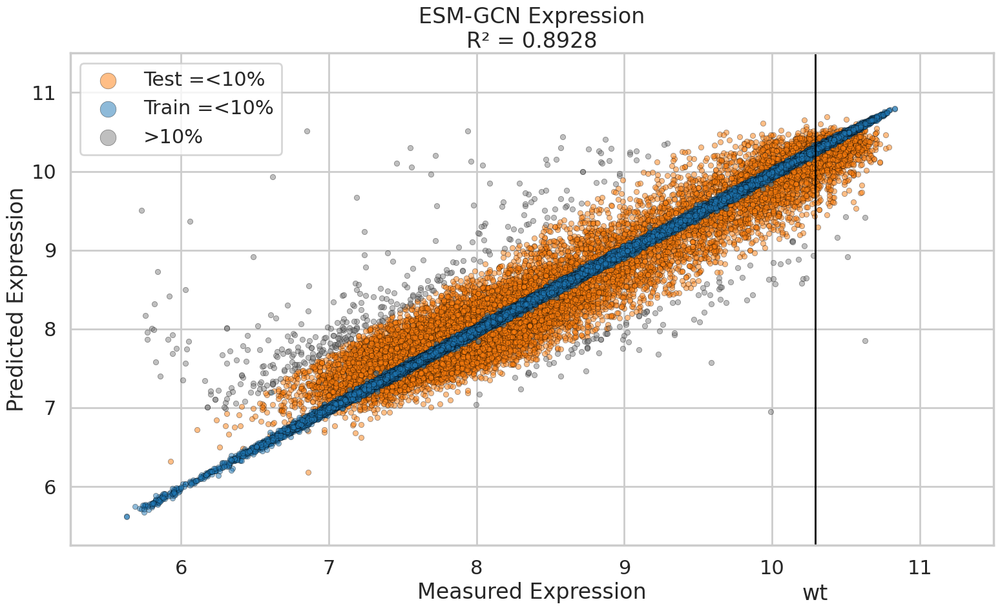

R^2: 0.875455388375682
R^2 outside of threshold: -0.0012288873284378443
R^2 inside of threshold: 0.9114110598456137


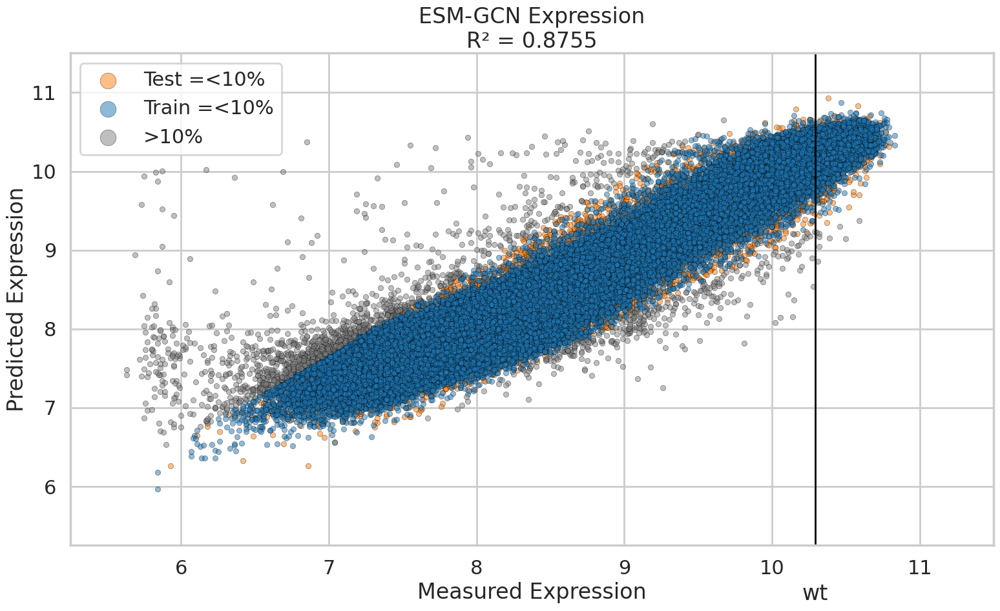

R^2: 0.5588155950380087
R^2 outside of threshold: -0.14770038275319108
R^2 inside of threshold: 0.8108160411081802


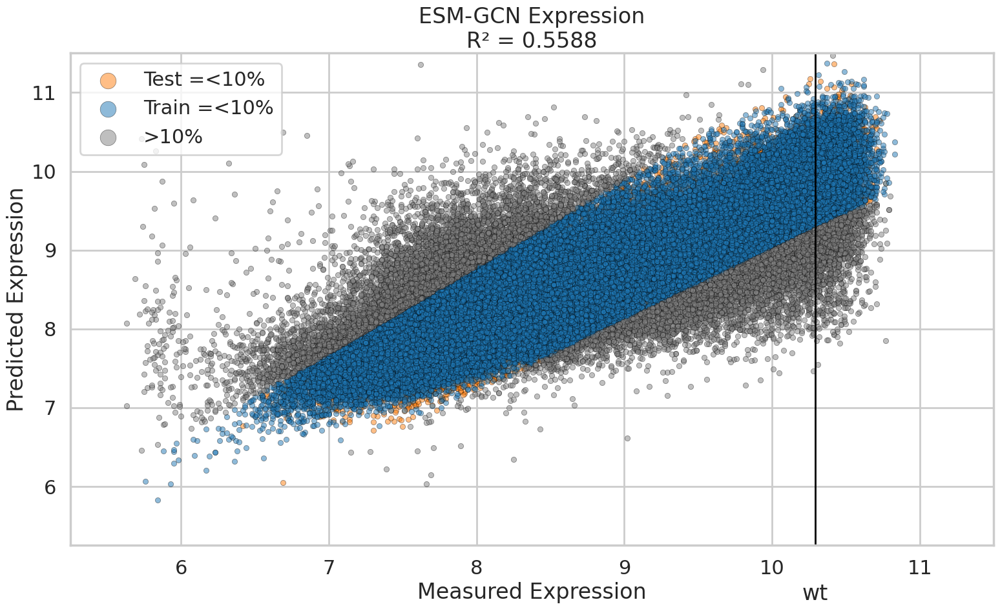

R^2: 0.49129026335418013
R^2 outside of threshold: -0.0762376529087685
R^2 inside of threshold: 0.7794444440194866


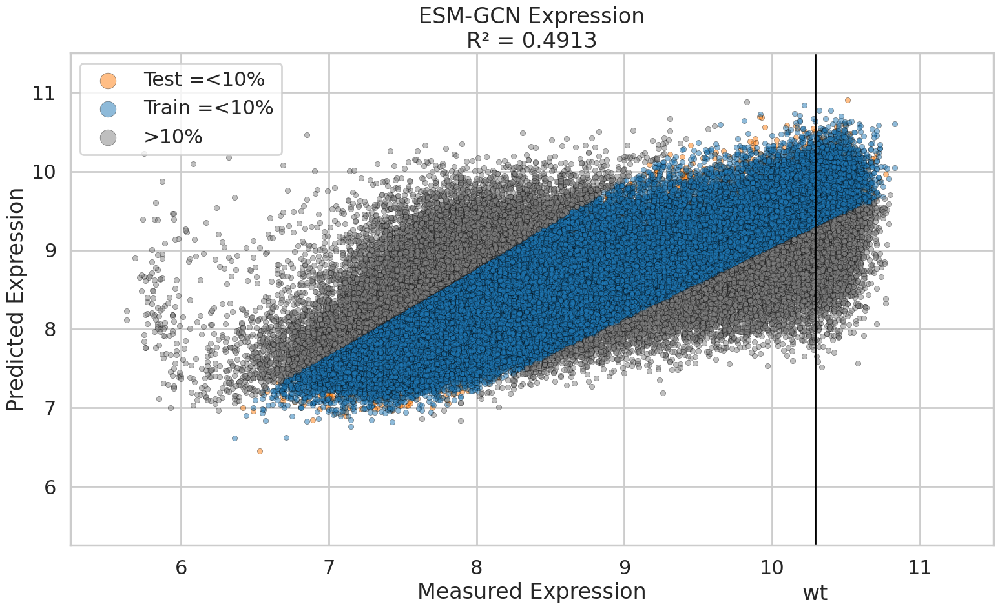

R^2: 0.8843692707214785
R^2 outside of threshold: -0.03986909736734168
R^2 inside of threshold: 0.9166022195714322


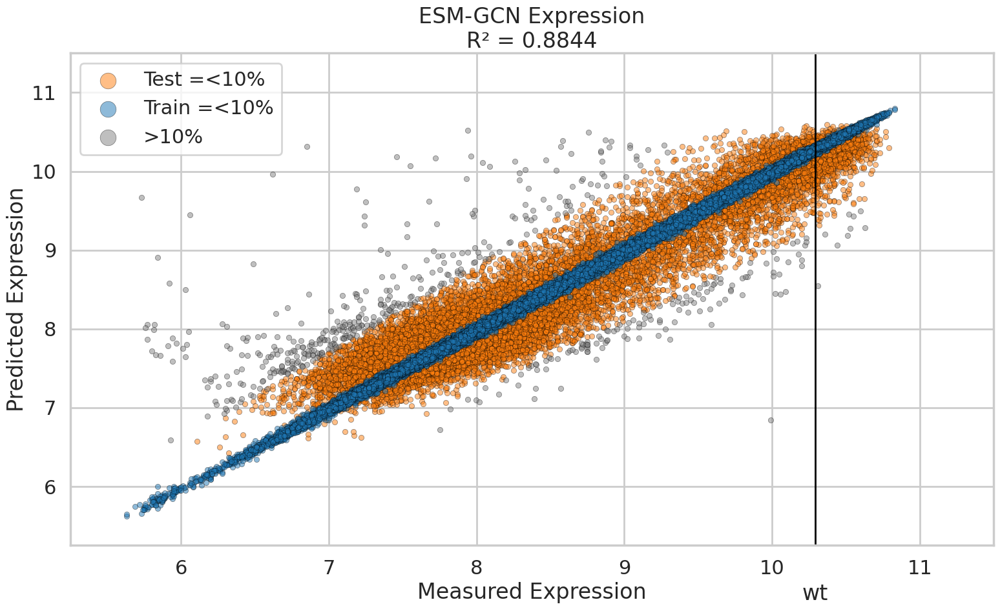

R^2: 0.8646748869896883
R^2 outside of threshold: -0.03309379617191022
R^2 inside of threshold: 0.9085888058536583


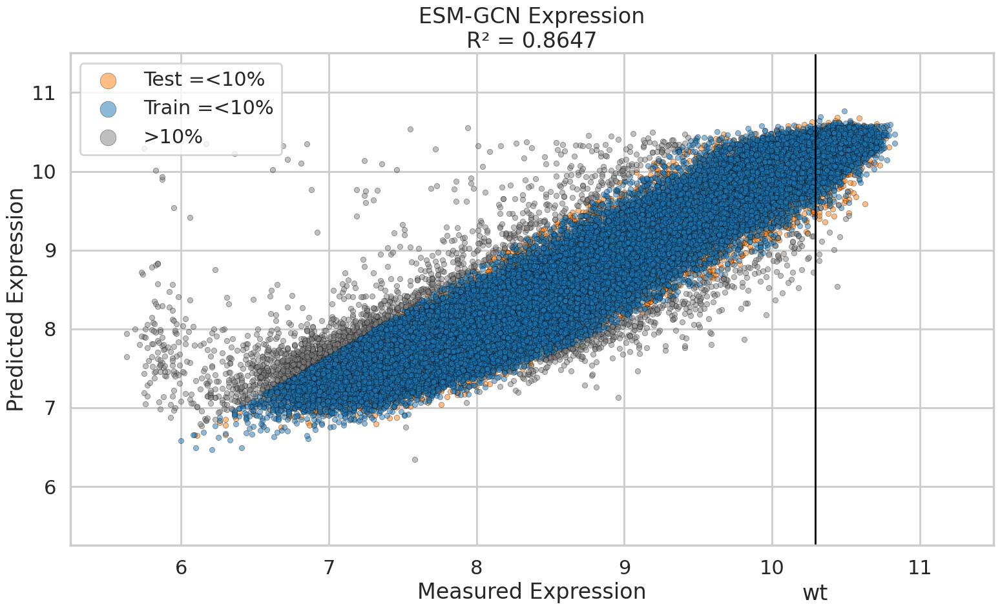

In [26]:
# Expression
df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.A.expression-predicted_vs_measured.values.csv")
esm_gcn_a_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.A.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.B.expression-predicted_vs_measured.values.csv")
esm_gcn_b_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.B.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.C.expression-predicted_vs_measured.values.csv")
esm_gcn_c_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.C.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.D.expression-predicted_vs_measured.values.csv")
esm_gcn_d_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.D.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.E.expression-predicted_vs_measured.values.csv")
esm_gcn_e_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.E.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.F.expression-predicted_vs_measured.values.csv")
esm_gcn_f_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.F.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.G.expression-predicted_vs_measured.values.csv")
esm_gcn_g_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.G.expression-predicted_vs_measured.scatter", expression_wt)

df = pd.read_csv("/data/spike_ml/Spike_NLP-Lightning/notebooks/models/scatter/esm_gcn/esm_gcn.H.expression-predicted_vs_measured.values.csv")
esm_gcn_h_expression = plot_predicted_value_scatter_with_threshold(df, "Expression", "ESM-GCN Expression", "scatter/esm_gcn/esm_gcn.H.expression-predicted_vs_measured.scatter", expression_wt)

---
### Bar Chart Stats

A.binding: 5:04:59
A.expression: 6:15:51
B.binding: 5:07:00
B.expression: 5:07:41
C.binding: 9:04:07
C.expression: 9:06:20
D.binding: 9:07:35
D.expression: 9:03:28
E.binding: 5:01:38
E.expression: 5:31:30
F.binding: 5:07:26
F.expression: 5:06:29
G.binding: 9:04:27
G.expression: 9:07:29
H.binding: 9:04:16
H.expression: 9:02:01



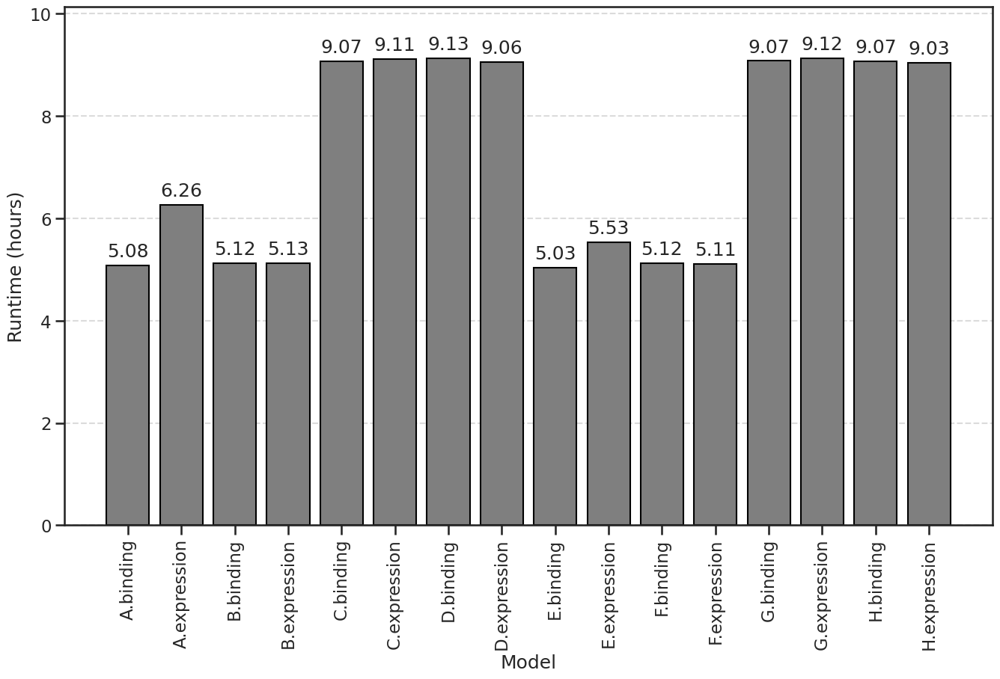

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

runtime_dict = {
    "A.binding": "5:04:59",
    "A.expression": "6:15:51",
    "B.binding": "5:07:00",
    "B.expression": "5:07:41",
    "C.binding": "9:04:07",
    "C.expression": "9:06:20",
    "D.binding": "9:07:35",
    "D.expression": "9:03:28",
    "E.binding": "5:01:38",
    "E.expression": "5:31:30",
    "F.binding": "5:07:26",
    "F.expression": "5:06:29",
    "G.binding": "9:04:27",
    "G.expression": "9:07:29",
    "H.binding": "9:04:16",
    "H.expression": "9:02:01",
}
for key, value in runtime_dict.items():
    print(f"{key}: {value}")
print("")

def parse_extended_time(time_str):
    hours, minutes, seconds = map(int, time_str.split(':'))
    td = timedelta(hours=hours, minutes=minutes, seconds=seconds)
    return td.total_seconds() / 3600  # Convert to hours

# Convert runtime dictionary to hours
runtime_hours = {k: parse_extended_time(v) for k, v in runtime_dict.items()}

# Manual spacing
custom_positions = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]  # Match spacing style
labels = list(runtime_hours.keys())
values = list(runtime_hours.values())

# Plot setup
sns.set_style("ticks")
sns.set_context("talk")
fig, ax = plt.subplots(figsize=(16, 9))

# Bar plot
bars = ax.bar(custom_positions, values, color='tab:grey', edgecolor='black')

# Dynamically get bar width
bar_width = bars[0].get_width()

# Annotate bar values
for i, val in zip(custom_positions, values):
    ax.text(i, val + 0.1, f"{val:.2f}", ha="center", va="bottom")

# Axis formatting
ax.set_xticks(custom_positions)
ax.set_xticklabels(labels, rotation=90)
ax.set_ylabel("Runtime (hours)")
ax.set_xlabel("Model")
ax.set_ylim(0, max(values) + 1)
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Save the figure to the "figures" subdirectory.
save_path = "bar/best_esm_gcn-runtime"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')

A: 0.924
B: 0.924
C: 8.8
D: 8.8
E: 0.924
F: 0.924
G: 8.8
H: 8.8



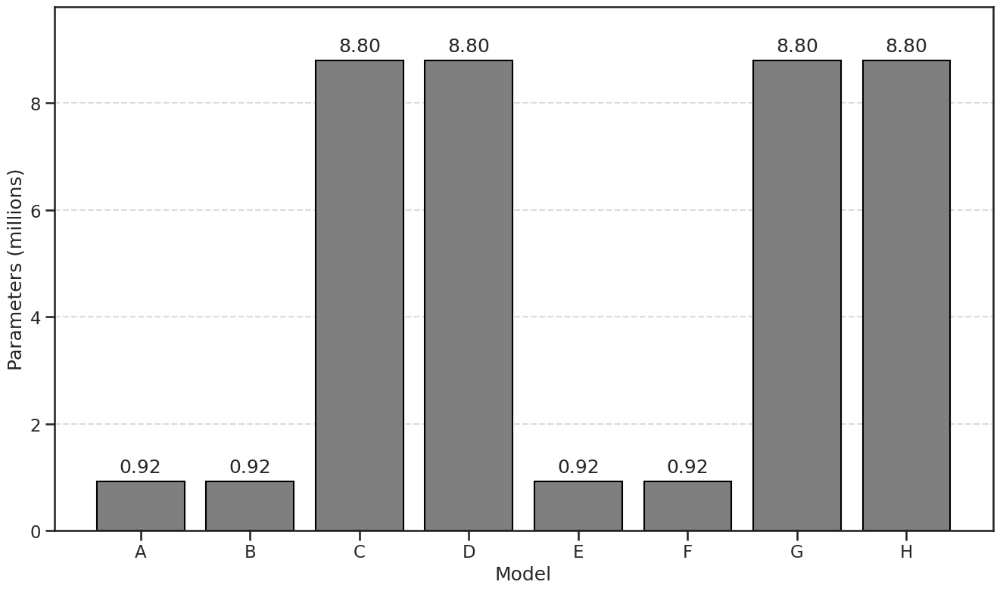

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

params_dict = {
    "A": 0.924,
    "B": 0.924,
    "C": 8.8,
    "D": 8.8,
    "E": 0.924,
    "F": 0.924,
    "G": 8.8,
    "H": 8.8,
}
for key, value in params_dict.items():
    print(f"{key}: {value}")
print("")

# Manual spacing
custom_positions = [0, 1, 2, 3, 4, 5, 6, 7]  # Match spacing style
labels = list(params_dict.keys())
values = list(params_dict.values())

# Plot setup
sns.set_style("ticks")
sns.set_context("talk")
fig, ax = plt.subplots(figsize=(16, 9))

# Bar plot
bars = ax.bar(custom_positions, values, color='tab:grey', edgecolor='black')

# Dynamically get bar width
bar_width = bars[0].get_width()

# Annotate bar values
for i, val in zip(custom_positions, values):
    ax.text(i, val + 0.1, f"{val:.2f}", ha="center", va="bottom")

# Axis formatting
ax.set_xticks(custom_positions)
ax.set_xticklabels(labels)
ax.set_ylabel("Parameters (millions)")
ax.set_xlabel("Model")
ax.set_ylim(0, max(values) + 1)
ax.grid(axis="y", linestyle="--", alpha=0.7)

# Save
save_path = "bar/best_esm_gcn-params"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')

A.binding: 0.6223320840124591
A.expression: 0.6299081382919702
B.binding: 0.6231528276600872
B.expression: 0.5926177410430962
C.binding: 0.9199186564939315
C.expression: 0.8927694832955763
D.binding: 0.9038806813486306
D.expression: 0.875455388375682
E.binding: 0.625986065495006
E.expression: 0.5588155950380087
F.binding: 0.5919726399364468
F.expression: 0.49129026335418013
G.binding: 0.9164182530019397
G.expression: 0.8843692707214785
H.binding: 0.8996575171700016
H.expression: 0.8646748869896883



ValueError: The number of FixedLocator locations (8), usually from a call to set_ticks, does not match the number of labels (16).

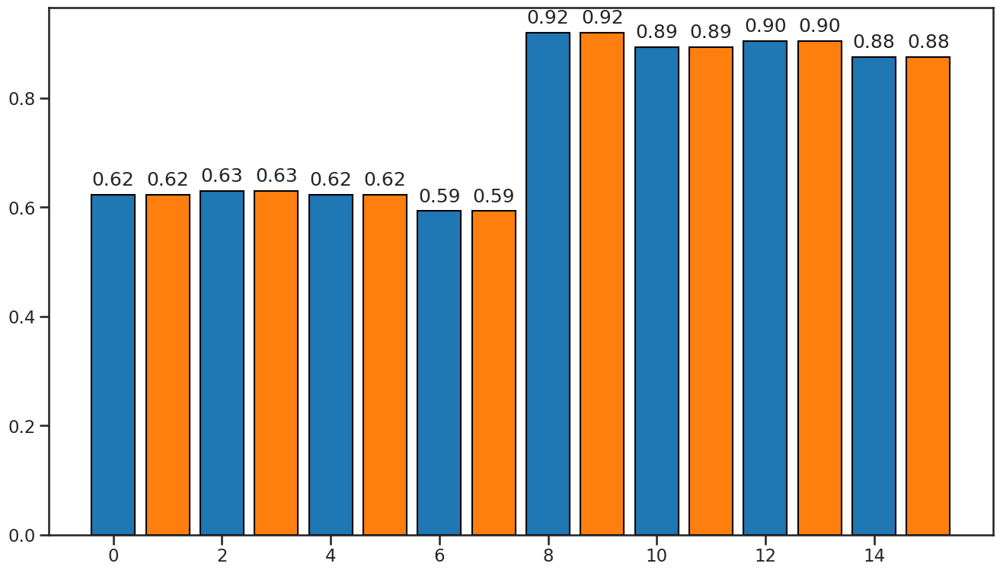

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt

r2_dict = {
    "A.binding": 0.6223320840124591,
    "A.expression": 0.6299081382919702,
    "B.binding": 0.6231528276600872,
    "B.expression": 0.5926177410430962,
    "C.binding": 0.9199186564939315,
    "C.expression": 0.8927694832955763,
    "D.binding": 0.9038806813486306,
    "D.expression": 0.875455388375682,
    "E.binding": 0.625986065495006,
    "E.expression": 0.5588155950380087,
    "F.binding": 0.5919726399364468,
    "F.expression": 0.49129026335418013,
    "G.binding": 0.9164182530019397,
    "G.expression": 0.8843692707214785,
    "H.binding": 0.8996575171700016,
    "H.expression": 0.8646748869896883
}
for key, value in r2_dict.items():
    print(f"{key}: {value}")
print("")

# Manual spacing
models = list("ABCDEFGH")
models = [f"{m}.{be}" for m in models for be in ("binding", "expression")]

positions = [0, 2, 4, 6, 8, 10, 12, 14]
binding_vals = [r2_dict[m] for m in models]
expression_vals = [r2_dict[m] for m in models]

# Plot
sns.set_style("ticks")
sns.set_context("talk")
fig, ax = plt.subplots(figsize=(16, 9))

# Plot one pair to get width
sample_binding_bar = ax.bar(positions[0], binding_vals[0], label="Binding", color="tab:blue", edgecolor="black")
sample_expression_bar = ax.bar(positions[0], expression_vals[0], label="Expression", color="tab:orange", edgecolor="black")

# Get bar width dynamically
bar_width = sample_binding_bar[0].get_width()
offset = bar_width / 2

# Clear and replot all with dynamic width
ax.cla()
for i, pos in enumerate(positions):
    binding_bar = ax.bar(pos, binding_vals[i], width=bar_width, color="tab:blue", edgecolor="black", label="Binding" if i == 0 else "")
    expr_bar = ax.bar(pos + 1, expression_vals[i], width=bar_width, color="tab:orange", edgecolor="black", label="Expression" if i == 0 else "")
    
    # Annotations
    ax.text(pos, binding_vals[i] + 0.01, f"{binding_vals[i]:.2f}", ha="center", va="bottom")
    ax.text(pos + 1, expression_vals[i] + 0.01, f"{expression_vals[i]:.2f}", ha="center", va="bottom")

# X-axis labels centered
ax.set_xticks(positions)
ax.set_xticklabels(models)

ax.set_ylabel("R²")
ax.set_ylim(0, 1)
ax.set_xlabel("Model")
ax.legend(loc='upper left', frameon=True)
ax.grid(axis='y', linestyle='--', alpha=0.7)

# Save the figure to the "figures" subdirectory.
save_path = "bar/best_esm_gcn-r_squared"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')

---
### Best RMSE Plots (C Binding, C Expression)

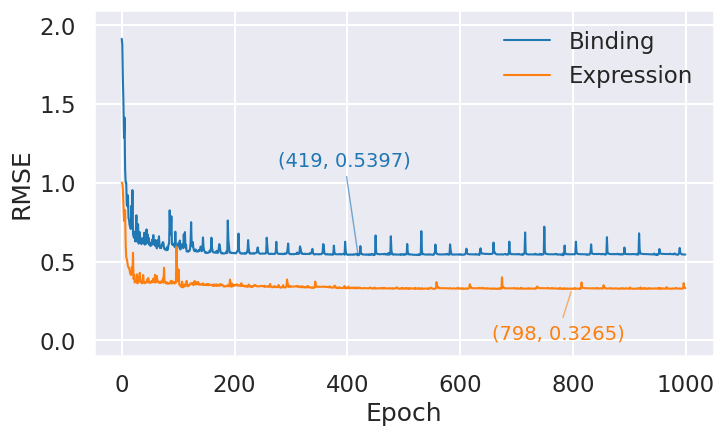

In [32]:
import os 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

log_dir = "../../src/pnlp/ESM_TL/logs/"
binding_test = os.path.join(log_dir, "esm_gcn/version_21774828/metrics.csv")
expression_test = os.path.join(log_dir, "esm_gcn/version_21774827/metrics.csv")

binding_df = pd.read_csv(
    binding_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
binding_merged_df = binding_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in binding_merged_df.columns:
    binding_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
binding_merged_df.loc[:, "epoch"] = (binding_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
binding_merged_df = binding_merged_df.sort_values("epoch").reset_index(drop=True)
binding_best_epoch = binding_merged_df.loc[binding_merged_df['val_rmse'].idxmin()]

expression_df = pd.read_csv(
    expression_test, 
    sep=',', 
    header=0,
    usecols=['epoch', 'val_rmse']
)

# Merge rows for each epoch and keep 'epoch' as a column
expression_merged_df = expression_df.groupby("epoch").ffill().bfill().drop_duplicates().reset_index()

# Ensure 'epoch' is correctly named and exists
if "epoch" not in expression_merged_df.columns:
    expression_merged_df.rename(columns={"index": "epoch"}, inplace=True)  # Rename if it was reset incorrectly

# Divide epoch by 2 to correct numbering
expression_merged_df.loc[:, "epoch"] = (expression_merged_df["epoch"] // 2).astype(int)

# Ensure sorting is correct
expression_merged_df = expression_merged_df.sort_values("epoch").reset_index(drop=True)
expression_best_epoch = expression_merged_df.loc[expression_merged_df['val_rmse'].idxmin()]

# Plot
sns.set_style('darkgrid')
sns.set_context('talk')
fig, ax = plt.subplots(figsize=(8, 4.5)) 

# Plot RMSE
ax.plot(binding_merged_df['epoch'], binding_merged_df['val_rmse'], label='Binding', color='tab:blue', linewidth=1.5)
ax.plot(expression_merged_df['epoch'], expression_merged_df['val_rmse'], label='Expression', color='tab:orange', linewidth=1.5)
ax.set_xlabel('Epoch')
ax.set_ylim(-50, 1050)
ax.set_ylabel('RMSE')
ax.set_ylim(-0.1, 2.1)
ax.legend(loc='upper right', frameon=False)

ax.annotate(
    f'({int(binding_best_epoch["epoch"])}, {binding_best_epoch["val_rmse"]:.4f})',
    (binding_best_epoch["epoch"], binding_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, 75), ha='center', va='top', color='tab:blue', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:blue', lw=1, alpha=0.6)
)

ax.annotate(
    f'({int(expression_best_epoch["epoch"])}, {expression_best_epoch["val_rmse"]:.4f})',
    (expression_best_epoch["epoch"], expression_best_epoch["val_rmse"]),
    textcoords="offset points", xytext=(-10, -25), ha='center', va='top', color='tab:orange', fontsize=14,
    arrowprops=dict(arrowstyle="-", color='tab:orange', lw=1, alpha=0.6)
)

# Save the figure to the "figures" subdirectory.
save_path = "rmse/best_esm_gcn-test_metrics"
plt.savefig(f"{save_path}.pdf", format='pdf', dpi=300, bbox_inches='tight')
plt.savefig(f"{save_path}.png", format='png', dpi=300, bbox_inches='tight')